In [1]:
from google.colab import drive
drive.mount('/content/gdrive/')

Drive already mounted at /content/gdrive/; to attempt to forcibly remount, call drive.mount("/content/gdrive/", force_remount=True).


In [ ]:
#%cd /content/gdrive/MyDrive

In [2]:
%cd /content/gdrive/MyDrive

/content/gdrive/MyDrive


In [3]:
import os
if not os.path.isdir("yolov8nas"):
  os.makedirs("yolov8nas")

In [5]:
%cd yolov8nas

/content/gdrive/MyDrive/yolov8nas


In [6]:
!pip install super-gradients
# pytorch based library. it is used for classification, detection, segmentation, post estimation etc
# In this library, we have 40+ pre-trained model available (Transfer Learning)
# Pytorch is open source ML framework, which is based on Deep Learning Model. Facebook developed this library.
# Multidimentional tensor - GPU Support. it can create dynamic computing graph
# SOTA - it can auto calculate the gradient and hence, name suggested super-gradient.

# !pip install imutils -
# !pip install roboflow -
# !pip install pytube --upgrade

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.0/12.0 MB 77.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 135.8/135.8 kB 17.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 684.5/684.5 kB 58.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 93.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.8/2.8 MB 98.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 408.6/408.6 kB 39.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.5/154.5 kB 21.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 kB 10.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 84.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.5/13.5 MB 66.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 68.0/68.0 kB 8.7 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to 

In [ ]:
# Note : please restart runtime first and then execute the further codes/steps

In [1]:
import super_gradients
from super_gradients.training import models
yolo_nas = super_gradients.training.models.get('yolo_nas_l', pretrained_weights="coco") # yolo_nas_l (l- large)
# coco - common object in context - 33 millons of data avaialbe (~80 images)

The console stream is logged into /root/sg_logs/console.log


[2023-11-25 05:04:48] INFO - crash_tips_setup.py - Crash tips is enabled. You can set your environment variable to CRASH_HANDLER=FALSE to disable it
[2023-11-25 05:04:48] WARNING - __init__.py - Failed to import pytorch_quantization
[2023-11-25 05:04:48] INFO - utils.py - NumExpr defaulting to 2 threads.
[2023-11-25 05:04:57] WARNING - calibrator.py - Failed to import pytorch_quantization
[2023-11-25 05:04:57] WARNING - export.py - Failed to import pytorch_quantization
[2023-11-25 05:04:57] WARNING - selective_quantization_utils.py - Failed to import pytorch_quantization
[2023-11-25 05:04:58] INFO - checkpoint_utils.py - License Notification: YOLO-NAS pre-trained weights are subjected to the specific license terms and conditions detailed in 
https://github.com/Deci-AI/super-gradients/blob/master/LICENSE.YOLONAS.md
By downloading the pre-trained weight files you agree to comply with these terms.
Downloading: "https://sghub.deci.ai/models/yolo_nas_l_coco.pth" to /root/.cache/torch/hub/ch

In [2]:
!pip install torchinfo

In [4]:
from torchinfo import summary

In [6]:
summary(model = yolo_nas, input_size=(16,3,640,640), col_names=["input_size", "output_size","num_params","trainable"],
        col_width=20, row_settings=["var_names"])

Layer (type (var_name))                                           Input Shape          Output Shape         Param #              Trainable
YoloNAS_L (YoloNAS_L)                                             [16, 3, 640, 640]    [16, 8400, 4]        --                   True
├─NStageBackbone (backbone)                                       [16, 3, 640, 640]    [16, 96, 160, 160]   --                   True
│    └─YoloNASStem (stem)                                         [16, 3, 640, 640]    [16, 48, 320, 320]   --                   True
│    │    └─QARepVGGBlock (conv)                                  [16, 3, 640, 640]    [16, 48, 320, 320]   3,024                True
│    └─YoloNASStage (stage1)                                      [16, 48, 320, 320]   [16, 96, 160, 160]   --                   True
│    │    └─QARepVGGBlock (downsample)                            [16, 48, 320, 320]   [16, 96, 160, 160]   88,128               True
│    │    └─YoloNASCSPLayer (blocks)                     

[2023-11-25 05:35:43] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


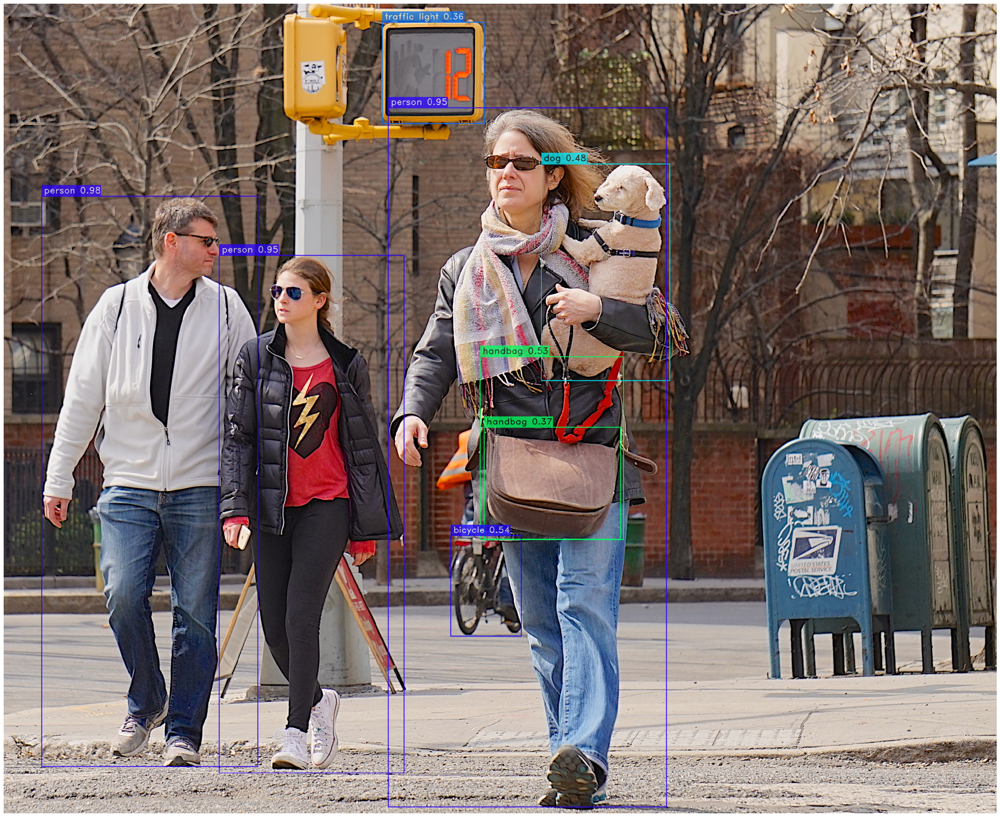

In [14]:
url = "/content/gdrive/MyDrive/yolov8nas/17214488690_d81a0ee584_o.jpg"
yolo_nas.predict(url, conf=0.35).show()

[2023-11-25 05:33:39] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


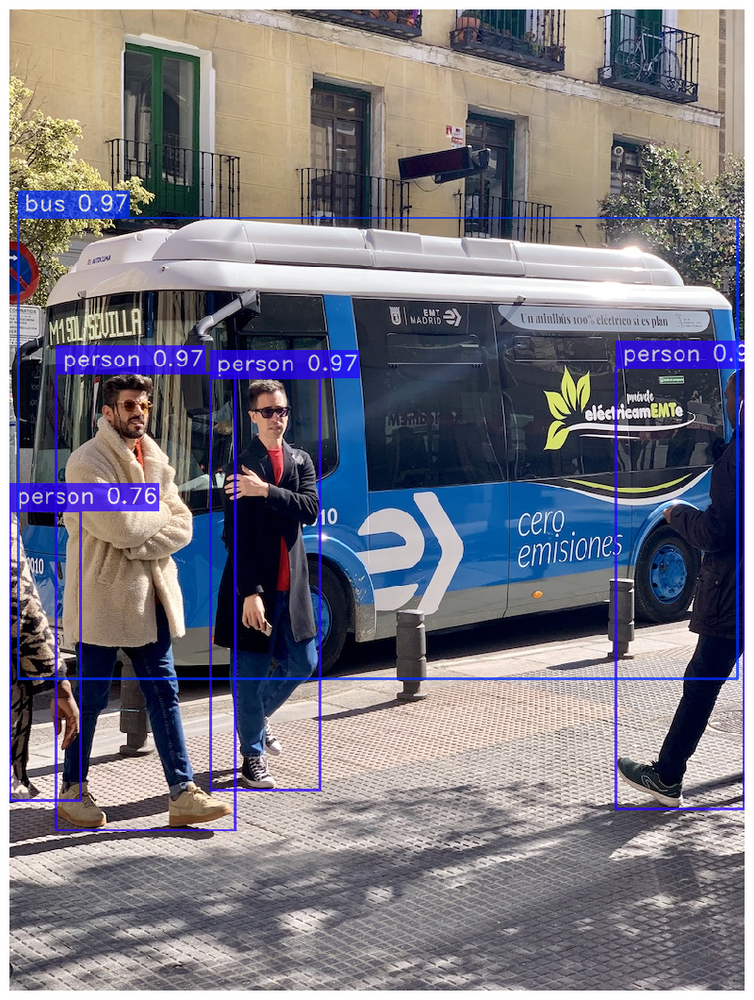

In [11]:
url = "/content/gdrive/MyDrive/yolov8nas/bus.jpg"
yolo_nas.predict(url, conf=0.75).show()

[2023-11-25 05:36:41] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


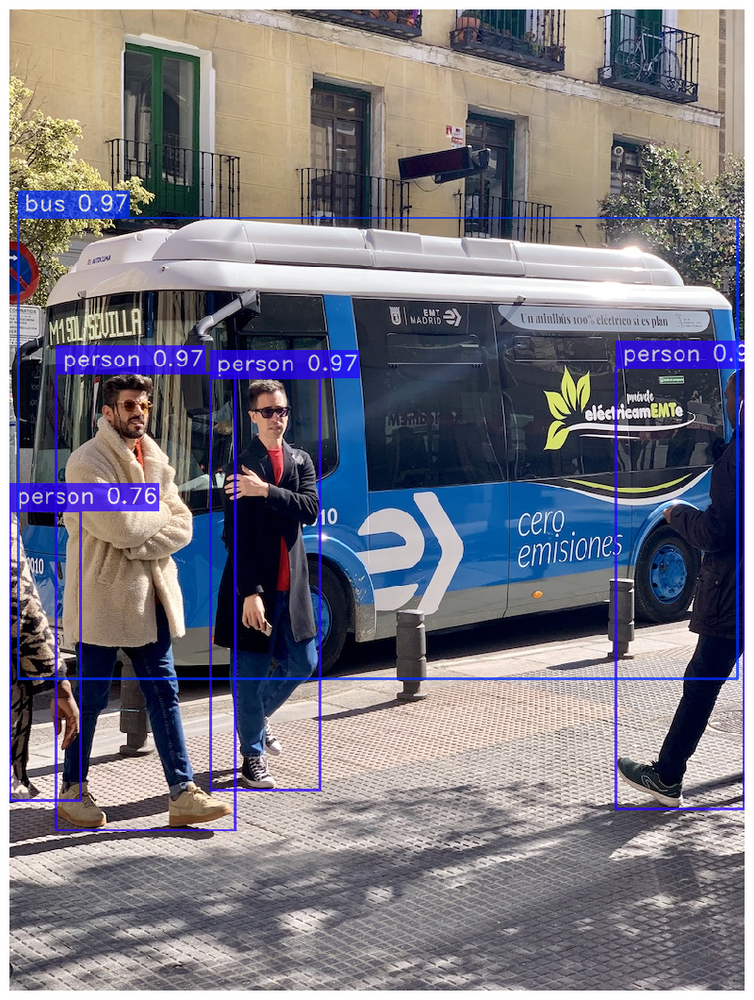

In [15]:
url = "/content/gdrive/MyDrive/yolov8nas/bus.jpg"
yolo_nas.predict(url, conf=0.35).show()

[2023-11-25 05:40:15] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


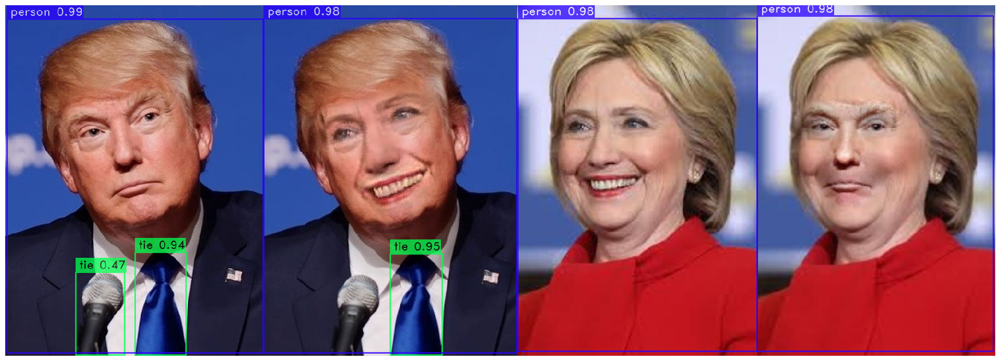

In [16]:
url = "/content/gdrive/MyDrive/yolov8nas/faceswap.JPG"
yolo_nas.predict(url, conf=0.35).show()

In [17]:
import torch
device = 'cuda' if torch.cuda.is_available() else "cpu"

In [18]:
input_video_path = f"/content/gdrive/MyDrive/yolov8nas/small_video.mp4"
output_video_path = "/content/gdrive/MyDrive/yolov8nas/object_detection.mp4"

In [19]:
yolo_nas.to(device).predict(input_video_path, conf=0.25).save(output_video_path)

Processing Video:   0%|          | 0/743 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/torch/amp/autocast_mode.py:250: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn(
[2023-11-25 05:50:59] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`
Processing Video:  99%|█████████▉| 734/743 [37:59<00:13,  1.54s/it]